<a href="https://colab.research.google.com/github/imanrnj/Best-README-Template/blob/master/AdoraNewBranch_v0_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
from PIL import Image
import numpy as np
import math
import time
import gc
import os
import colorsys
import math
import random
import shutil
import json

# from keras.utils.data_utils import shutil
import matplotlib.pyplot as plt
from psutil import virtual_memory

from google.colab.patches import cv2_imshow
%matplotlib inline

from typing import Tuple, Optional
from scipy.ndimage import sobel

import keras
from keras.preprocessing.image import ImageDataGenerator#,array_to_img,img_to_array, load_img
from keras.utils import  img_to_array, load_img
from keras.models import Sequential, load_model,Model
from keras.applications.vgg19 import VGG19,preprocess_input
import tensorflow as tf
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

In [ ]:
QUARTERSPATH='/content/quarter'
os.mkdir(QUARTERSPATH)

In [ ]:
WIDTH_FIRST = 'width-first'
HEIGHT_FIRST = 'height-first'
VALID_ORDERS = (WIDTH_FIRST, HEIGHT_FIRST)

FORWARD_ENERGY = 'forward'
BACKWARD_ENERGY = 'backward'
VALID_ENERGY_MODES = (FORWARD_ENERGY, BACKWARD_ENERGY)

DROP_MASK_ENERGY = 1e5
KEEP_MASK_ENERGY = 1e3

VSEAM_MASK=[]
HSEAM_MASK=[]

def _rgb2gray(rgb: np.ndarray) -> np.ndarray:
    """Convert an RGB image to a grayscale image"""
    coeffs = np.array([0.2125, 0.7154, 0.0721], dtype=np.float32)
    return (rgb @ coeffs).astype(rgb.dtype)


def _get_seam_mask(src: np.ndarray, seam: np.ndarray) -> np.ndarray:
    """Convert a list of seam column indices to a mask"""
    return ~np.eye(src.shape[1], dtype=np.bool)[seam]


def _remove_seam_mask(src: np.ndarray, seam_mask: np.ndarray) -> np.ndarray:
    """Remove a seam from the source image according to the given seam_mask"""
    if src.ndim == 3:
        h, w, c = src.shape
        seam_mask = np.dstack([seam_mask] * c)
        dst = src[seam_mask].reshape((h, w - 1, c))
    else:
        h, w = src.shape
        dst = src[seam_mask].reshape((h, w - 1))
    return dst


def _remove_seam(src: np.ndarray, seam: np.ndarray) -> np.ndarray:
    """Remove a seam from the source image, given a list of seam columns"""
    seam_mask = _get_seam_mask(src, seam)
    dst = _remove_seam_mask(src, seam_mask)
    return dst


def _get_energy(gray: np.ndarray) -> np.ndarray:
    """Get backward energy map from the source image"""
    assert gray.ndim == 2

    gray = gray.astype(np.float32)
    grad_x = sobel(gray, axis=1)
    grad_y = sobel(gray, axis=0)
    energy = np.abs(grad_x) + np.abs(grad_y)
    return energy


def _get_backward_seam(energy: np.ndarray) -> np.ndarray:
    """Compute the minimum vertical seam from the backward energy map"""
    assert energy.size > 0 and energy.ndim == 2
    h, w = energy.shape
    cost = energy[0]
    parent = np.empty((h, w), dtype=np.int32)
    base_idx = np.arange(-1, w - 1, dtype=np.int32)

    for r in range(1, h):
        left_shift = np.hstack((cost[1:], np.inf))
        right_shift = np.hstack((np.inf, cost[:-1]))
        min_idx = np.argmin([right_shift, cost, left_shift],
                            axis=0) + base_idx
        parent[r] = min_idx
        cost = cost[min_idx] + energy[r]

    c = np.argmin(cost)
    seam = np.empty(h, dtype=np.int32)

    for r in range(h - 1, -1, -1):
        seam[r] = c
        c = parent[r, c]

    return seam


def _get_backward_seams(gray: np.ndarray, num_seams: int,
                        keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Compute the minimum N vertical seams using backward energy"""
    h, w = gray.shape
    seams_mask = np.zeros((h, w), dtype=np.bool)
    rows = np.arange(0, h, dtype=np.int32)
    idx_map = np.tile(np.arange(0, w, dtype=np.int32), h).reshape((h, w))
    energy = _get_energy(gray)
    for _ in range(num_seams):
        if keep_mask is not None:
            energy[keep_mask] += KEEP_MASK_ENERGY
        seam = _get_backward_seam(energy)
        seams_mask[rows, idx_map[rows, seam]] = True

        seam_mask = _get_seam_mask(gray, seam)
        gray = _remove_seam_mask(gray, seam_mask)
        idx_map = _remove_seam_mask(idx_map, seam_mask)
        if keep_mask is not None:
            keep_mask = _remove_seam_mask(keep_mask, seam_mask)

        # Only need to re-compute the energy in the bounding box of the seam
        _, cur_w = energy.shape
        lo = max(0, np.min(seam) - 1)
        hi = min(cur_w, np.max(seam) + 1)
        pad_lo = 1 if lo > 0 else 0
        pad_hi = 1 if hi < cur_w - 1 else 0
        mid_block = gray[:, lo - pad_lo:hi + pad_hi]
        _, mid_w = mid_block.shape
        mid_energy = _get_energy(mid_block)[:, pad_lo:mid_w - pad_hi]
        energy = np.hstack((energy[:, :lo], mid_energy, energy[:, hi + 1:]))

    return seams_mask


def _get_forward_seam(gray: np.ndarray,
                      keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Compute the minimum vertical seam using forward energy"""
    assert gray.size > 0 and gray.ndim == 2
    gray = gray.astype(np.float32)
    h, w = gray.shape

    top_row = gray[0]
    top_row_lshift = np.hstack((top_row[1:], top_row[-1]))
    top_row_rshift = np.hstack((top_row[0], top_row[:-1]))
    dp = np.abs(top_row_lshift - top_row_rshift)

    parent = np.zeros(gray.shape, dtype=np.int32)
    base_idx = np.arange(-1, w - 1, dtype=np.int32)

    for r in range(1, h):
        curr_row = gray[r]
        curr_lshift = np.hstack((curr_row[1:], curr_row[-1]))
        curr_rshift = np.hstack((curr_row[0], curr_row[:-1]))
        cost_top = np.abs(curr_lshift - curr_rshift)
        if keep_mask is not None:
            cost_top[keep_mask[r]] += KEEP_MASK_ENERGY

        prev_row = gray[r - 1]
        cost_left = cost_top + np.abs(prev_row - curr_rshift)
        cost_right = cost_top + np.abs(prev_row - curr_lshift)

        dp_left = np.hstack((np.inf, dp[:-1]))
        dp_right = np.hstack((dp[1:], np.inf))

        choices = np.vstack([cost_left + dp_left, cost_top + dp,
                             cost_right + dp_right])
        dp = np.min(choices, axis=0)
        parent[r] = np.argmin(choices, axis=0) + base_idx

    c = np.argmin(dp)

    seam = np.empty(h, dtype=np.int32)
    for r in range(h - 1, -1, -1):
        seam[r] = c
        c = parent[r, c]

    return seam


def _get_forward_seams(gray: np.ndarray, num_seams: int,
                       keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Compute minimum N vertical seams using forward energy"""
    h, w = gray.shape
    seams_mask = np.zeros((h, w), dtype=np.bool)
    rows = np.arange(0, h, dtype=np.int32)
    idx_map = np.tile(np.arange(0, w, dtype=np.int32), h).reshape((h, w))
    for _ in range(num_seams):
        seam = _get_forward_seam(gray, keep_mask)
        seams_mask[rows, idx_map[rows, seam]] = True
        seam_mask = _get_seam_mask(gray, seam)
        gray = _remove_seam_mask(gray, seam_mask)
        idx_map = _remove_seam_mask(idx_map, seam_mask)
        if keep_mask is not None:
            keep_mask = _remove_seam_mask(keep_mask, seam_mask)

    return seams_mask


def _get_seams(gray: np.ndarray, num_seams: int, energy_mode: str,
               keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Get the minimum N seams from the grayscale image"""
    assert energy_mode in VALID_ENERGY_MODES
    if energy_mode == BACKWARD_ENERGY:
        return _get_backward_seams(gray, num_seams, keep_mask)
    else:
        return _get_forward_seams(gray, num_seams, keep_mask)


def _reduce_width(src: np.ndarray, delta_width: int, energy_mode: str,
                  keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Reduce the width of image by delta_width pixels"""
    assert src.ndim in (2, 3) and delta_width >= 0
    if src.ndim == 2:
        gray = src
        src_h, src_w = src.shape
        dst_shape = (src_h, src_w - delta_width)
    else:
        gray = _rgb2gray(src)
        src_h, src_w, src_c = src.shape
        dst_shape = (src_h, src_w - delta_width, src_c)

    seams_mask = _get_seams(gray, delta_width, energy_mode, keep_mask)
    dst = src[~seams_mask].reshape(dst_shape)
    # print(seams_mask.shape,src.shape)
    # print(seams_mask.shape)
    # cv2_imshow(seams_mask*255)
    return dst,seams_mask


def _expand_width(src: np.ndarray, delta_width: int, energy_mode: str,
                  keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Expand the width of image by delta_width pixels"""
    assert src.ndim in (2, 3) and delta_width >= 0
    if src.ndim == 2:
        gray = src
        src_h, src_w = src.shape
        dst_shape = (src_h, src_w + delta_width)
    else:
        gray = _rgb2gray(src)
        src_h, src_w, src_c = src.shape
        dst_shape = (src_h, src_w + delta_width, src_c)

    seams_mask = _get_seams(gray, delta_width, energy_mode, keep_mask)
    dst = np.empty(dst_shape, dtype=np.int32)

    for row in range(src_h):
        dst_col = 0
        for src_col in range(src_w):
            if seams_mask[row, src_col]:
                lo = max(0, src_col - 1)
                hi = src_col + 1
                dst[row, dst_col] = src[row, lo:hi].mean(axis=0)
                dst_col += 1
            dst[row, dst_col] = src[row, src_col]
            dst_col += 1
        assert dst_col == src_w + delta_width

    return dst,seams_mask


def _resize_width(src: np.ndarray, width: int, energy_mode: str,
                  keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Resize the width of image by removing vertical seams"""
    assert src.size > 0 and src.ndim in (2, 3)
    assert width > 0
    assert energy_mode in VALID_ENERGY_MODES

    src_w = src.shape[1]
    if src_w < width:
        dst,seams_mask = _expand_width(src, width - src_w, energy_mode, keep_mask)
    else:
        dst,seams_mask = _reduce_width(src, src_w - width, energy_mode, keep_mask)
    return dst,seams_mask


def _resize_height(src: np.ndarray, height: int, energy_mode: str,
                   keep_mask: Optional[np.ndarray]) -> np.ndarray:
    """Resize the height of image by removing horizontal seams"""
    assert src.ndim in (2, 3) and height > 0
    # if keep_mask is not None:
    #     keep_mask = keep_mask.T
    if src.ndim == 3:
        src,hseams_mask = _resize_width(src.transpose((1, 0, 2)), height, energy_mode,
                            keep_mask)
        src=src.transpose((1, 0, 2))
    else:
        src,hseams_mask = _resize_width(src.T, height, energy_mode, keep_mask)
        src=src.T
    return src,hseams_mask


def _check_mask(mask: np.ndarray, shape: Tuple[int, int]) -> np.ndarray:
    """Ensure the mask to be a 2D grayscale map of specific shape"""
    mask = np.asarray(mask, dtype=np.bool)
    if mask.ndim != 2:
        raise ValueError('Invalid mask of shape {}: expected to be a 2D '
                         'binary map'.format(mask.shape))
    if mask.shape != shape:
        raise ValueError('The shape of mask must match the image: expected {}, '
                         'got {}'.format(shape, mask.shape))
    return mask


def _check_src(src: np.ndarray) -> np.ndarray:
    """Ensure the source to be RGB or grayscale"""
    src = np.asarray(src, dtype=np.float32)
    if src.size == 0 or src.ndim not in (2, 3):
        raise ValueError('Invalid src of shape {}: expected an 3D RGB image or '
                         'a 2D grayscale image'.format(src.shape))
    return src


def resize(src: np.ndarray, size: Tuple[int, int],
           energy_mode: str = 'backward', order: str = 'width-first',
           keep_mask: Optional[np.ndarray] = None) -> np.ndarray:
    """Resize the image using the content-aware seam-carving algorithm.
    :param src: A source image in RGB or grayscale format.
    :param size: The target size in pixels, as a 2-tuple (width, height)
    :param energy_mode: Policy to compute energy for the source image. Could be
        one of ``backward`` or ``forward``. If ``backward``, compute the energy
        as the gradient at each pixel. If ``forward``, compute the energy as the
        distances between adjacent pixels after each pixel is removed.
    :param order: The order to remove horizontal and vertical seams. Could be
        one of ``width-first`` or ``height-first``. In ``width-first`` mode, we
        remove or insert all vertical seams first, then the horizontal ones,
        while ``height-first`` is the opposite.
    :param keep_mask: An optional mask where the foreground is protected from
        seam removal. If not specify, no area will be protected.
    :return: A resized copy of the source image.
    """
    src = _check_src(src)
    src_h, src_w = src.shape[:2]

    width, height = size
    width = int(round(width))
    height = int(round(height))
    if width <= 0 or height <= 0:
        raise ValueError('Invalid size {}: expected > 0'.format(size))
    if width >= 2 * src_w:
        raise ValueError('Invalid target width {}: expected less than twice '
                         'the source width (< {})'.format(width, 2 * src_w))
    if height >= 2 * src_h:
        raise ValueError('Invalid target height {}: expected less than twice '
                         'the source height (< {})'.format(height, 2 * src_h))

    if order not in VALID_ORDERS:
        raise ValueError('Invalid order {}: expected {}'.format(
            order, VALID_ORDERS))

    if energy_mode not in VALID_ENERGY_MODES:
        raise ValueError('Invalid energy mode {}: expected {}'.format(
            energy_mode, VALID_ENERGY_MODES))

    if keep_mask is not None:
        keep_mask = _check_mask(keep_mask, (src_h, src_w))

    if order == WIDTH_FIRST:
        src,vseams_mask = _resize_width(src, width, energy_mode, keep_mask)
        src,hseams_mask = _resize_height(src, height, energy_mode, keep_mask)
    else:
        src,hseams_mask = _resize_height(src, height, energy_mode, keep_mask)
        src,vseams_mask = _resize_width(src, width, energy_mode, keep_mask)

    return src,vseams_mask,hseams_mask

def remove_with_seams_mask(src: np.ndarray, size: Tuple[int, int],seams_mask: Optional[np.ndarray]):
  """Reduce the width of image by delta_width pixels"""
  src = _check_src(src)
  src_h, src_w = src.shape[:2]

  width, height = size
  width = int(round(width))
  height = int(round(height))
  if src_w < width:
    delta_width= width - src_w
  else:
    delta_width= src_w - width

  assert src.ndim in (2, 3) and delta_width >= 0
  if src.ndim == 2:
      gray = src
      src_h, src_w = src.shape
      dst_shape = (src_h, src_w - delta_width)
  else:
      gray = _rgb2gray(src)
      src_h, src_w, src_c = src.shape
      dst_shape = (src_h, src_w - delta_width, src_c)
  dst = src[~seams_mask].reshape(dst_shape)
  # print(seams_mask.shape)
  # cv2_imshow(seams_mask*255)

  return dst

def expand_with_seams_mask(src: np.ndarray, size: Tuple[int, int],seams_mask: Optional[np.ndarray]):
    """Expand the width of image by delta_width pixels"""
    src = _check_src(src)
    src_h, src_w = src.shape[:2]

    width, height = size
    width = int(round(width))
    height = int(round(height))
    if src_w < width:
      delta_width= width - src_w
    else:
      delta_width= src_w - width
    assert src.ndim in (2, 3) and delta_width >= 0
    if src.ndim == 2:
        gray = src
        src_h, src_w = src.shape
        dst_shape = (src_h, src_w + delta_width)
    else:
        gray = _rgb2gray(src)
        src_h, src_w, src_c = src.shape
        dst_shape = (src_h, src_w + delta_width, src_c)

    dst = np.empty(dst_shape, dtype=np.int32)

    for row in range(src_h):
        dst_col = 0
        for src_col in range(src_w):
            if seams_mask[row, src_col]:
                lo = max(0, src_col - 1)
                hi = src_col + 1
                dst[row, dst_col] = src[row, lo:hi].mean(axis=0)
                dst_col += 1
            dst[row, dst_col] = src[row, src_col]
            dst_col += 1
        assert dst_col == src_w + delta_width

    return dst

In [ ]:
SELECTED=11
def extractFeatureMap(imagePath,inputSize):
  # Build a VGG19 model loaded with pre-trained ImageNet weights
  model = VGG19(weights = 'imagenet', include_top = False ,input_shape=inputSize)
  # Get the symbolic outputs of each "key" layer (we gave them unique names).
  outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
  # Set up a model that returns the activation values for every layer in VGG19 (as a dict).
  model= keras.Model(inputs = model.inputs, outputs = outputs_dict)
  result_height, result_width,_ = inputSize
  img = load_img(imagePath, target_size = (result_height, result_width))
  arr = img_to_array(img)
  arr = np.expand_dims(arr, axis = 0)
  arr = preprocess_input(arr)
  content_tensor= tf.convert_to_tensor(arr)
  # layerList=['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']
  layerList=['block1_conv2']
  feature_map=model(content_tensor)
  FI=[]
  for layer_name in layerList:
    FI.append(feature_map[layer_name].astype('float32'))
  # for layer_name, feature_map in zip(layer_names, feature_maps):
  #   if layer_name in layerList:
  #     FI.append(feature_map.astype(np.uint8))
  return FI


# def CalcSeamCarving(img,factors):
#   h,w=img.shape
#   dx=int(w*factors[0]-w)
#   dy=int(h*factors[1]-h)
#   print('new deltas',dx,dy)
#   SO=seam_carving1(img, dx, dy, True)
#   return SO

def CalcSeamCarving(img,factors):
  SO,vseams,hseams=resize(
    img,
    (img.shape[1]*factors, img.shape[0]),
    energy_mode='forward',   # Choose from {backward, forward}
    order='width-first',  # Choose from {width-first, height-first}
    keep_mask=None)
  # cv2_imshow(vseams*255)
  # cv2_imshow(hseams*255)
  return SO,vseams,hseams

def CalcImportantMaps(featureMaps,factors):
  SC=[]
  Ft=[]
  # VS=[]
  HS=[]
  i=1
  for fm in featureMaps:
    print('------------------------------')
    Sl=[]
    VS=[]
    k=fm.shape[-1]
    selectedFt=11
    grayFm=fm[0,:,:,selectedFt]
    showFeatureMapI(featureMaps,I=11)
    so,vseams,hseams=CalcSeamCarving(grayFm,factors)
    cv2_imshow(vseams*255)
    Sl.append(so)
    VS.append(vseams)
    HS.append(hseams)
    for ch in range(k):
      print('*****\t'+str(ch)+'/'+str(k))
      grayFm=fm[0,:,:,ch]
      # grayFm=cv2.cvtColor(fm[0,:,:,ch],cv2.COLOR_GRAY2RGB)
      # carvedFm=CalcSeamCarving(grayFm,factors)
      # grayFm=cv2.cvtColor(carvedFm,cv2.COLOR_RGB2GRAY)
      if ch==selectedFt:
        continue
        so,vseams,hseams=CalcSeamCarving(grayFm,factors)
        cv2_imshow(vseams*255)
        # cv2_imshow(hseams*255)
      else:
        so=remove_with_seams_mask(grayFm,
        (grayFm.shape[1]*factors, grayFm.shape[0])
        ,seams_mask=VS[0])
        # so,vseams,hseams=resize(
        # grayFm,
        # (grayFm.shape[1]*factors, grayFm.shape[0]),
        # energy_mode='forward',   # Choose from {backward, forward}
        # order='width-first',  # Choose from {width-first, height-first}
        # keep_mask=~VS[0])
      Sl.append(so)
      VS.append(vseams)
      HS.append(hseams)
    SC.append(np.linalg.norm(Sl,axis=0))
    Ft.append(np.array(Sl))

    # print(i,fm.shape)
    # i+=1
  return np.array(Ft)#,np.array(SC),VS,HS

def CalcImportantMaps2(featureMaps,factors):
  SC=[]
  Ft=[]
  VS=[]
  HS=[]
  i=1
  for fm in featureMaps:
    print('------------------------------')
    Sl=[]
    VS=[]
    k=fm.shape[-1]
    selectedFt=SELECTED
    grayFm=fm[0,:,:,selectedFt]
    grayFm=cv2.rotate(grayFm,cv2.ROTATE_90_CLOCKWISE)
    showFeatureMapI(featureMaps,I=selectedFt)
    so,vseams,hseams=CalcSeamCarving(grayFm,factors)
    cv2_imshow(vseams*255)
    Sl.append(cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE))
    VS.append(vseams)
    HS.append(hseams)
    for ch in range(k):
      print('*****\t'+str(ch)+'/'+str(k))
      grayFm=fm[0,:,:,ch]
      grayFm=cv2.rotate(grayFm,cv2.ROTATE_90_CLOCKWISE)
      # grayFm=cv2.cvtColor(fm[0,:,:,ch],cv2.COLOR_GRAY2RGB)
      # carvedFm=CalcSeamCarving(grayFm,factors)
      # grayFm=cv2.cvtColor(carvedFm,cv2.COLOR_RGB2GRAY)
      if ch==selectedFt:
        continue
        so,vseams,hseams=CalcSeamCarving(grayFm,factors)
        cv2_imshow(vseams*255)
        # cv2_imshow(hseams*255)
      else:
        so=remove_with_seams_mask(grayFm,
        (grayFm.shape[1]*factors, grayFm.shape[0])
        ,seams_mask=VS[0])
        # so,vseams,hseams=resize(
        # grayFm,
        # (grayFm.shape[1]*factors, grayFm.shape[0]),
        # energy_mode='forward',   # Choose from {backward, forward}
        # order='width-first',  # Choose from {width-first, height-first}
        # keep_mask=~VS[0])
      so=cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE)
      Sl.append(so)
      VS.append(vseams)
      HS.append(hseams)
    SC.append(np.linalg.norm(Sl,axis=0))
    Ft.append(np.array(Sl))

    # print(i,fm.shape)
    # i+=1
  return np.array(Ft)#,np.array(SC),VS,HS

def CalcImportantMaps3(featureMaps,factors):
  SC=[]
  Ft=[]
  VS=[]
  HS=[]
  i=1
  for fm in featureMaps:
    print('------------------------------')
    Sl=[]
    VS=[]
    k=fm.shape[-1]
    selectedFt=SELECTED
    grayFm=fm[0,:,:,selectedFt]
    grayFm=cv2.rotate(grayFm,cv2.ROTATE_90_CLOCKWISE)
    showFeatureMapI(featureMaps,I=selectedFt)
    so,vseams,hseams=CalcSeamCarving(grayFm,factors)
    cv2_imshow(vseams*255)
    Sl.append(cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE))
    VS.append(vseams)
    HS.append(hseams)
    for ch in range(k):
      print('*****\t'+str(ch)+'/'+str(k))
      grayFm=fm[0,:,:,ch]
      grayFm=cv2.rotate(grayFm,cv2.ROTATE_90_CLOCKWISE)
      # grayFm=cv2.cvtColor(fm[0,:,:,ch],cv2.COLOR_GRAY2RGB)
      # carvedFm=CalcSeamCarving(grayFm,factors)
      # grayFm=cv2.cvtColor(carvedFm,cv2.COLOR_RGB2GRAY)
      if ch==selectedFt:
        continue
        so,vseams,hseams=CalcSeamCarving(grayFm,factors)
        cv2_imshow(vseams*255)
        # cv2_imshow(hseams*255)
      else:
        so=expand_with_seams_mask(grayFm,
        (grayFm.shape[1]*factors, grayFm.shape[0])
        ,seams_mask=VS[0])
        # so,vseams,hseams=resize(
        # grayFm,
        # (grayFm.shape[1]*factors, grayFm.shape[0]),
        # energy_mode='forward',   # Choose from {backward, forward}
        # order='width-first',  # Choose from {width-first, height-first}
        # keep_mask=~VS[0])
      so=cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE)
      Sl.append(so)
      VS.append(vseams)
      HS.append(hseams)
    SC.append(np.linalg.norm(Sl,axis=0))
    Ft.append(np.array(Sl))

    # print(i,fm.shape)
    # i+=1
  return np.array(Ft)#,np.array(SC),VS,HS

def CalcImportantMapsShowFilter(featureMaps,factors):
  Ft=[]
  i=1
  for fm in featureMaps:
    print('------------------------------')
    Sl=[]
    k=fm.shape[-1]
    for ch in range(k):
      print('*****\t'+str(ch)+'/'+str(k))
      grayFm=fm[0,:,:,ch]
      showFeatureMapI(featureMaps,I=ch)
      so,vseams,hseams=CalcSeamCarving(grayFm,factors)
      cv2_imshow(vseams*255)
      Sl.append(so)
    Ft.append(np.array(Sl))
  return np.array(Ft)


def CalcImportantMaps3ShowFilter(featureMaps,factors):
  Ft=[]
  masks=[]
  for fm in featureMaps:
    print('------------------------------')
    Sl=[]
    k=fm.shape[-1]
    for ch in range(k):
      print('*****\t'+str(ch)+'/'+str(k))
      grayFm=fm[0,:,:,ch]
      grayFm=cv2.rotate(grayFm,cv2.ROTATE_90_CLOCKWISE)
      showFeatureMapI(featureMaps,I=ch)
      so,vseams,hseams=CalcSeamCarving(grayFm,factors)
      masks.append(cv2.rotate(vseams*255,cv2.ROTATE_90_COUNTERCLOCKWISE))
      cv2_imshow(masks[-1])
      so=cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE)
      Sl.append(so)
    Ft.append(np.array(Sl))
  return np.array(Ft),masks


In [ ]:
def makeCarpetLandscapeAndSave(imgPath):
    img=cv2.imread(imgPath)
    h,w=img.shape[0:2]
    if h>w:
        print('[rotating]',imgPath)
        rotatedImg=cv2.rotate(img,cv2.ROTATE_90_CLOCKWISE)
        cv2.imwrite(imgPath,rotatedImg)

def makeCarpetQuarter(imgPath):
    img=cv2.imread(imgPath)
    h,w=img.shape[0:2]
    newH=h//2
    newW=w//2
    croppedImg=img[:newH,:newW]
    return croppedImg

def saveCarpetQuarter(imgPath):
    croppedImg=makeCarpetQuarter(imgPath)
    fileName=imgPath.split('/')[-1]
    cv2.imwrite(os.path.join(QUARTERSPATH,fileName),croppedImg)
    print('[Saving cropped Image]',os.path.join(QUARTERSPATH,fileName))
    return os.path.join(QUARTERSPATH,fileName)

def makeCarpetQuarterX2(imgPath):
    img=cv2.imread(imgPath)
    h,w=img.shape[0:2]
    newH=h//4
    newW=w//4
    croppedImg=img[:newH,:newW]
    return croppedImg

def saveCarpetQuarterX2(imgPath):
    croppedImg=makeCarpetQuarterX2(imgPath)
    fileName=imgPath.split('/')[-1]
    cv2.imwrite(os.path.join(QUARTERSPATH,fileName),croppedImg)
    print('[Saving cropped Image]',os.path.join(QUARTERSPATH,fileName))
    return os.path.join(QUARTERSPATH,fileName)


def calcShaneTarakom(img,inputMxM,isQuartered):
  h,w=img.shape[0:2]
  Ms=inputMxM.split('x')
  Ms=list(map(float, Ms))
  arz=min(Ms)
  tool=max(Ms)
  shane=min(h,w)//arz*(1+isQuartered)
  tarakom=max(h,w)//tool*(1+isQuartered)
  return shane,tarakom

def analyzePallet(img,inputMxM,isQuartered=0):
  h,w=img.shape[0:2]
  print('h & w',h,w)
  print('h/w',h/w)
  shane,tarakom=calcShaneTarakom(img,inputMxM,isQuartered)
  print('shane & tarakom',shane,tarakom)
  colorsCount,colorS=CountandShowImagePallet(img)



def newSizeCalc(shane,tarakom,outputMxM,isQuartered=1):
  Ms=outputMxM.split('x')
  Ms=list(map(float, Ms))
  arz=min(Ms)
  tool=max(Ms)
  newH=shane*arz//(1+isQuartered)
  newW=tarakom*tool//(1+isQuartered)
  return int(newH),int(newW)
  # print('newH & newW',newH,newW)

def convertPipeline(imagePath,inputMxM,outputMxM,isQuartered=0):
  print('[making landscape]')
  makeCarpetLandscapeAndSave(imagePath)
  img = cv2.imread(imagePath)
  # cv2_imshow(img)
  print('[analyzing...]')
  h,w=img.shape[0:2]
  print('\th & w',h,w)
  print('\tw/h',w/h)
  shane,tarakom=calcShaneTarakom(img,inputMxM,isQuartered)
  print('\tshane & tarakom',shane,tarakom)
  colorsCount,colorS=CountandShowImagePallet(img)
  if isQuartered:
    fileName = imagePath.split('/')[-1]
    cv2.imwrite(os.path.join(QUARTERSPATH,fileName),img)
    print('[Copying Quartered Image]',os.path.join(QUARTERSPATH,fileName))
    qImagePath = os.path.join(QUARTERSPATH,fileName)
  else:
    qImagePath = saveCarpetQuarter(imagePath)
  newH,newW=newSizeCalc(shane,tarakom,outputMxM)
  print('[finalH & finalW]',newH,newW)
  ratioOut=newW/newH
  print('ratioOut',ratioOut)
  tempQuarteredImage=cv2.imread(qImagePath)
  tempH,tempW=tempQuarteredImage.shape[0:2]
  print('[newH & newW]',int(tempW//ratioOut),tempW)
  Ms=inputMxM.split('x')
  Ms=list(map(float, Ms))
  i_arz=min(Ms)
  i_tool=max(Ms)
  Ms=outputMxM.split('x')
  Ms=list(map(float, Ms))
  arz=min(Ms)
  tool=max(Ms)
  paletteAnalysis= {"id": 1, "input_length_m": i_tool,"input_width_m": i_arz,"input_length_pixel": max(h,w),
                    "input_width_pixel": min(h,w), "tarakom": int(tarakom), "shane":int(shane) ,
                    "output_length_m": int(tool),"output_width_m": int(arz),"output_length_pixel":int(max(tarakom*tool,shane*arz)) , "output_width_pixel":int(min(tarakom*tool,shane*arz)) }
  with open(f"./paletteAnalysis.txt", "w") as f:
        f.write(json.dumps(paletteAnalysis))
  return colorS

In [ ]:
def printMemoryStats():

  ram_gb = virtual_memory().total / 1e9
  print('--> {:.1f} gigabytes of total RAM\n'.format(ram_gb))
  ram_gb = virtual_memory().available / 1e9
  print('--> {:.1f} gigabytes of available RAM\n'.format(ram_gb))
  ram_gb = virtual_memory().used / 1e9
  print('--> {:.1f} gigabytes of used RAM\n'.format(ram_gb))
  gc.collect()
  ram_gb = virtual_memory().used / 1e9
  print('--> {:.1f} gigabytes of used RAM\n'.format(ram_gb))

def showFeatureMapI(featureMap,I=0):
  feature_image = featureMap[0][0, :, :, I]
  feature_image-= feature_image.mean()
  feature_image/= tf.math.reduce_std(feature_image)
  feature_image*=  64
  feature_image+= 128
  feature_image= np.clip(feature_image, 0, 255).astype('uint8')
  # image_belt[:, i * h : (i + 1) * h] = feature_image
  plt.imshow(feature_image)
  plt.show()

In [ ]:
def CountandShowImagePallet(img):
  # pallet=img.copy()
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  im_pil = Image.fromarray(img)
  colors=im_pil.getcolors(img.shape[0]*img.shape[1])
  count=len(colors)
  print('colors:',count)
  pallet=img[0:50,0:count*50].copy()
  colorS=[]
  for i,cls in enumerate(sorted(colors,reverse=True)):
    cvColor=(cls[1][2],cls[1][1],cls[1][0])
    colorS.append(cvColor)
    pallet[0:50,i*50:(i+1)*50]=cvColor
  cv2_imshow(pallet)
  cv2.imwrite('colors.jpg',pallet)
  return count,colorS

def makeImageNColors(image,N):
  # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  pixel_values = image.reshape((-1, 3))
  pixel_values = np.float32(pixel_values)
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
  # labels = np.random.randint(N,size=(image.shape[0], image.shape[1]),dtype=np.int32)
  # reshaped_labels = np.reshape(labels, (labels.shape[0] * labels.shape[1], 1))
  _, labels, (centers) = cv2.kmeans(pixel_values, N, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
  centers = np.uint8(centers)
  labels = labels.flatten()
  generated_image = centers[labels.flatten()]
  generated_image = generated_image.reshape(image.shape)
  # generated_image=cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
  # cv2_imshow(generated_image)
  return generated_image

In [ ]:
def makeColors(n=1000):
  colours_length = n
  colours = []
  for i in range(1, colours_length):
      colours.append (
          [
              255,
              random.randint(250,255),
              random.randint(0,255)
          ]
      )
  return colours

def showPallet(colors,height=40):
  pallet = np.zeros((height, len(colors), 3), dtype = "uint8")
  for index,color in enumerate(colors):
    pallet[:,index,:]=color

  cv2_imshow(cv2.cvtColor(pallet,cv2.COLOR_RGB2BGR))
  # cv2_imshow(pallet)
  print()

def RGBsort(colors):
  colors.sort()
  showPallet(colors)

def HSVsort(colors):
  colors.sort(key=lambda rgb: colorsys.rgb_to_hsv(*rgb))
  showPallet(colors)

def HLSsort(colors):
  colors.sort(key=lambda rgb: colorsys.rgb_to_hls(*rgb))
  showPallet(colors)

def lum (r,g,b):
    return math.sqrt( .241 * r + .691 * g + .068 * b )

def lumeSort(colors):
  colors.sort(key=lambda rgb: lum(*rgb))
  showPallet(colors)

def stepSort(colors):
  def step (r,g,b, repetitions=8):
    lum = math.sqrt( .241 * r + .691 * g + .068 * b )
    h, s, v = colorsys.rgb_to_hsv(r,g,b)
    h2 = int(h * repetitions)
    lum2 = int(lum * repetitions)
    v2 = int(v * repetitions)
    if h2 % 2 == 1:
        v2 = repetitions - v2
        lum = repetitions - lum
    return [h2, lum, v2]
  colors.sort(key=lambda rgb: step(*rgb))
  showPallet(colors)

def lums (color):
    return math.sqrt( .241 * color[0] + .691 * color[1] + .068 * color[2] )

def getDist(r,g,b):
    black=[0,0,0]
    return math.dist(black,[r,g,b])
def distSort(colors,ret=False):

  white=[255,255,255]
  colors.sort(key=lambda rgb: getDist(*rgb))
  if ret:
    return colors
  showPallet(colors)
  # print(colors[:20])
  # for i in range(0,len(colors)):
  #   for j in range(1,len(colors)-1):
  #     if math.dist(colors[j][1:],colors[j-1][1:])>math.dist(colors[j][1:],colors[j+1][1:]):
  #       c=colors[j+1]
  #       colors[j+1]=colors[j-1]
  #       colors[j-1]=c

  # showPallet(colors)
  # print(colors[:20])


In [ ]:
printMemoryStats()

--> 13.6 gigabytes of total RAM

--> 12.1 gigabytes of available RAM

--> 1.2 gigabytes of used RAM

--> 1.2 gigabytes of used RAM



In [ ]:
# !unzip /content/6811801521363.zip -d /content/
# !unzip "/content/6811804610663.zip" -d /content/
!unzip "/content/9_SETAYESH_rangi_final.zip" -d /content/

Archive:  /content/9_SETAYESH_rangi_final.zip
  inflating: /content/9_SETAYESH_rangi_final.bmp  


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

In [ ]:
!cp '/content/drive/MyDrive/Vintage/vintageJPG.zip' './vintageJPG.zip'
!cp '/content/drive/MyDrive/Vintage/vintage12JPG.zip' './vintage12JPG.zip'
!mkdir './images'
!unzip /content/vintageJPG.zip -d /content/images
!unzip /content/vintage12JPG.zip -d /content/
!cp -r '/content/images/content/Vintage/Artwork' '/content/images/Artwork'
!cp -r '/content/images/content/Vintage/jpg' '/content/images/jpg'
!rm -r '/content/images/content'
!mkdir './oneClass'
!cp -r '/content/images/jpg' '/content/oneClass'
!cp '/content/drive/MyDrive/Resize/CarpetClassification.h5' './CarpetClassification.h5'

In [ ]:
for files in os.listdir('/content/'):
  if '.zip' in files:
    print("!unzip \""+files+"\" -d /content/")


!unzip "t_9_narin_noghrei.zip" -d /content/
!unzip "Shahrokh.Dilman-Turauoise-1.5x2.25-Qom-v2.zip" -d /content/
!unzip "12_nahid_f_00.zip" -d /content/
!unzip "almas_9m_k2_hg_1400.zip" -d /content/
!unzip "9_noyan_f-rangi-final.zip" -d /content/


In [ ]:
!unzip "t_9_narin_noghrei.zip" -d /content/
!unzip "Shahrokh.Dilman-Turauoise-1.5x2.25-Qom-v2.zip" -d /content/
!unzip "12_nahid_f_00.zip" -d /content/
!unzip "almas_9m_k2_hg_1400.zip" -d /content/
!unzip "9_noyan_f-rangi-final.zip" -d /content/
!unzip "/content/6811804610663.zip" -d /content/

unzip:  cannot find or open t_9_narin_noghrei.zip, t_9_narin_noghrei.zip.zip or t_9_narin_noghrei.zip.ZIP.
unzip:  cannot find or open Shahrokh.Dilman-Turauoise-1.5x2.25-Qom-v2.zip, Shahrokh.Dilman-Turauoise-1.5x2.25-Qom-v2.zip.zip or Shahrokh.Dilman-Turauoise-1.5x2.25-Qom-v2.zip.ZIP.
unzip:  cannot find or open 12_nahid_f_00.zip, 12_nahid_f_00.zip.zip or 12_nahid_f_00.zip.ZIP.
unzip:  cannot find or open almas_9m_k2_hg_1400.zip, almas_9m_k2_hg_1400.zip.zip or almas_9m_k2_hg_1400.zip.ZIP.
unzip:  cannot find or open 9_noyan_f-rangi-final.zip, 9_noyan_f-rangi-final.zip.zip or 9_noyan_f-rangi-final.zip.ZIP.
Archive:  /content/6811804610663.zip
  inflating: /content/12_tabrizan_f_00.bmp  


In [ ]:
for files in os.listdir('/content/'):
  if '.bmp' in files:
    print(files)


9_SETAYESH_rangi_final.bmp


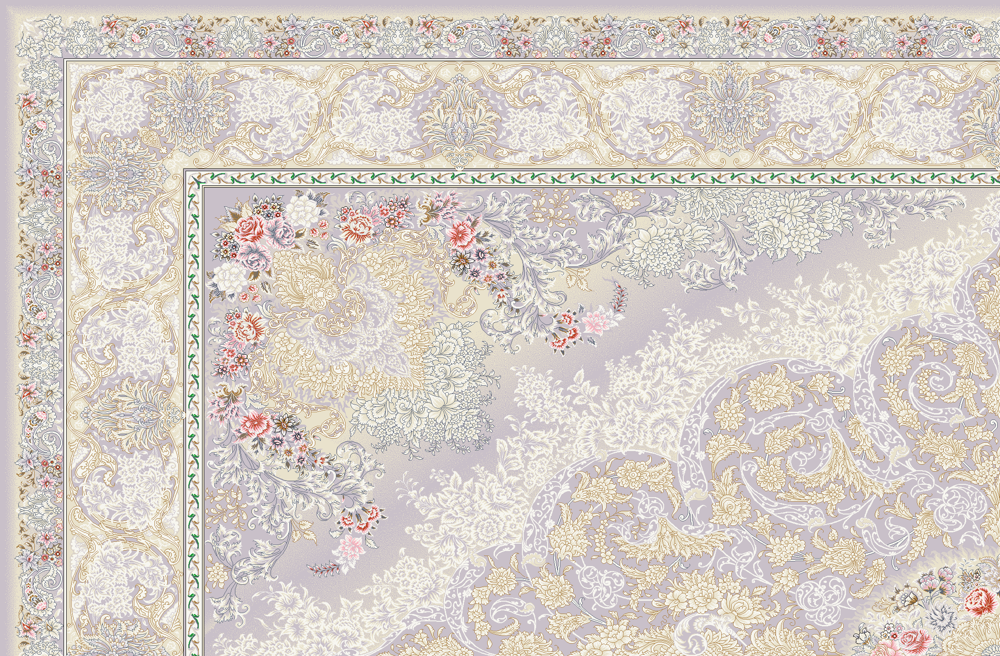

In [ ]:
qImagePath='/content/quarter/9_SETAYESH_rangi_final.bmp'
img=cv2.imread(qImagePath)
cv2_imshow(img)

/content/9SOLTA-G.bmp
[making landscape]
[analyzing...]
	h & w 1244 1750
	w/h 1.4067524115755627
	shane & tarakom 497.0 500.0
colors: 8


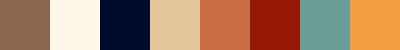

[Saving cropped Image] /content/quarter/9SOLTA-G.bmp
[finalH & finalW] 497 750
ratioOut 1.5090543259557343
[newH & newW] 579 875



In [ ]:
# imagePath="9_noyan_f-rangi-final.bmp"
# print(imagePath)
# convertPipeline(imagePath,"2.5x3.5","2x3",isQuartered=0)
# print()

# imagePath="Shahrokh.Dilman-Turauoise-1.5x2.25-Qom-v2.bmp"
# print(imagePath)
# convertPipeline(imagePath,"1.5x2.25","2x3",isQuartered=0)
# print()

# imagePath="/content/9_SETAYESH_rangi_final.bmp"
# print(imagePath)
# convertPipeline(imagePath,"3.5x2.5","2x3",isQuartered=0)

# print()

# imagePath="9.950.afshan 1000--- - Copy - Copy.bmp"
# print(imagePath)
# convertPipeline(imagePath,"2.5x3.5","2x3",isQuartered=1)
# print()

# imagePath="12_nahid_f_00.bmp"
# print(imagePath)
# convertPipeline(imagePath,"3x4","2x3",isQuartered=0)
# print()

imagePath="/content/9SOLTA-G.bmp"
print(imagePath)
colorS=convertPipeline(imagePath,"2.5x3.5","2x3",isQuartered=0)
print()

inputSize (622, 875, 3)
targetSize (497, 750)
factors (0.7990353697749196, 0.8571428571428571)
deltas (-125, -125)


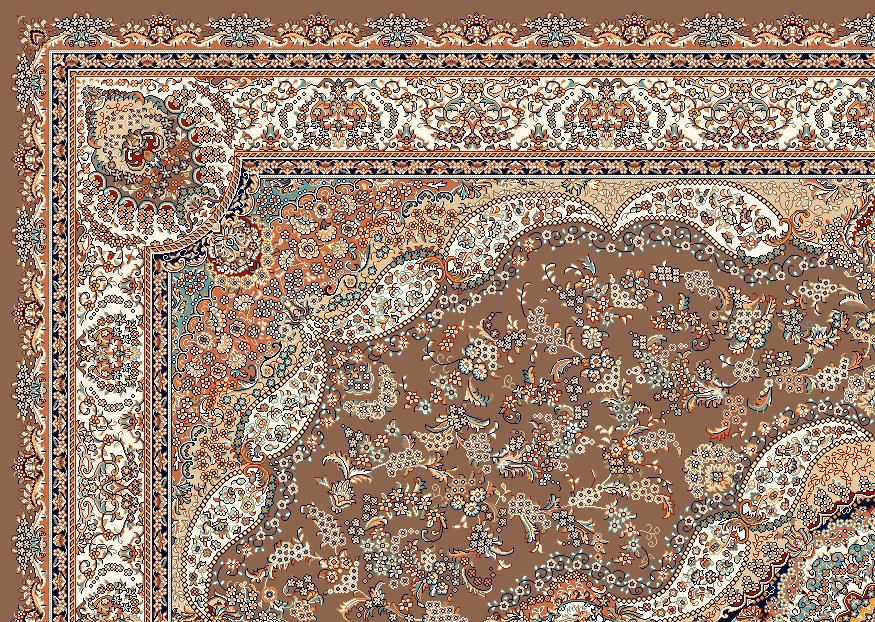

80134624/80134624 [==============================] - 0s 0us/step
feature maps
(1, 622, 875, 64)


In [ ]:
gc.collect()
#pipeline
# imagePath= "/content/oneClass/jpg/6pSABA-6M.jpg"
# imagePath= "/content/almas_9m_k2_hg_1400.bmp"
# makeCarpetLandscapeAndSave(imagePath)
# QUARTERSPATH='/content/quarter'
# try:
#   shutil.rmtree(QUARTERSPATH)
#   os.mkdir(QUARTERSPATH)
# except:
#   os.mkdir(QUARTERSPATH)
# qImagePath=saveCarpetQuarter(imagePath)
qImagePath='/content/quarter/9SOLTA-G.bmp'
img=cv2.imread(qImagePath)

inputSize=img.shape
targetSize=( 497 ,750)

print('inputSize',inputSize)
print('targetSize',targetSize)
fy=targetSize[0]/inputSize[0]
fx=targetSize[1]/inputSize[1]
dy=targetSize[0]-inputSize[0]
dx=targetSize[1]-inputSize[1]
factors=(fy,fx)
deltas=(int(dx),int(dy))
print('factors',factors)
print('deltas',deltas)
cv2_imshow(img)
FI=extractFeatureMap(qImagePath,inputSize)
print('feature maps')
for fm in FI:
    print(fm.shape)


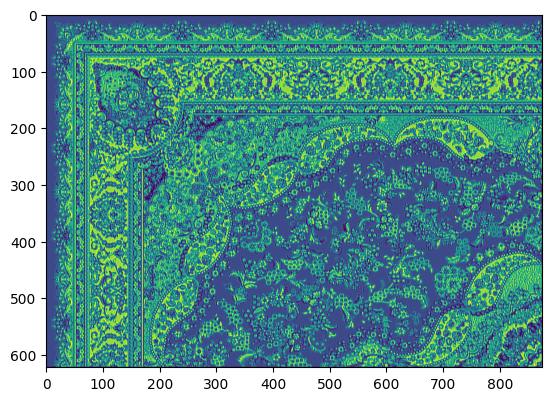

<ipython-input-3-d270f7418bd9>:165: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  seams_mask = np.zeros((h, w), dtype=np.bool)
<ipython-input-3-d270f7418bd9>:23: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return ~np.eye(src.shape[1], dtype=np.bool)[seam]


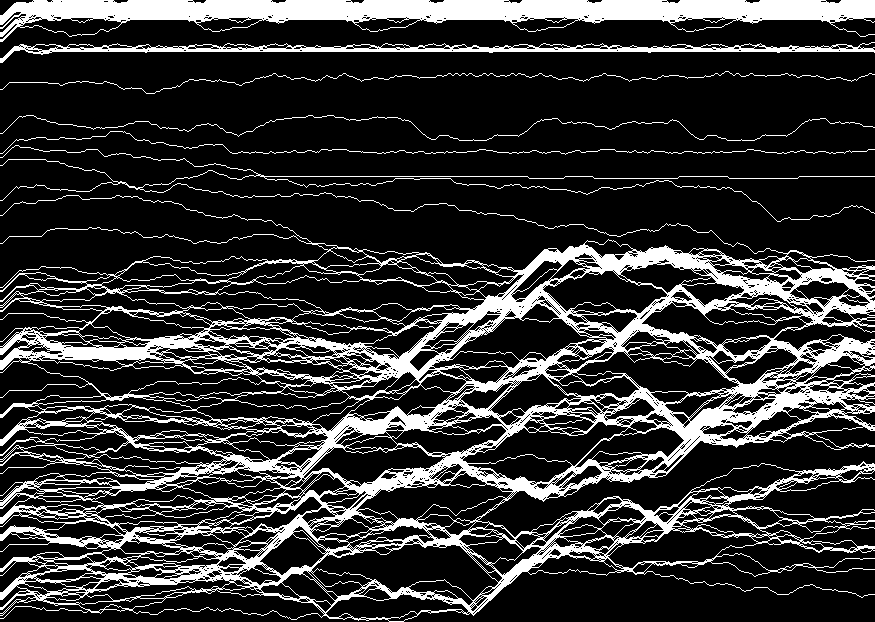

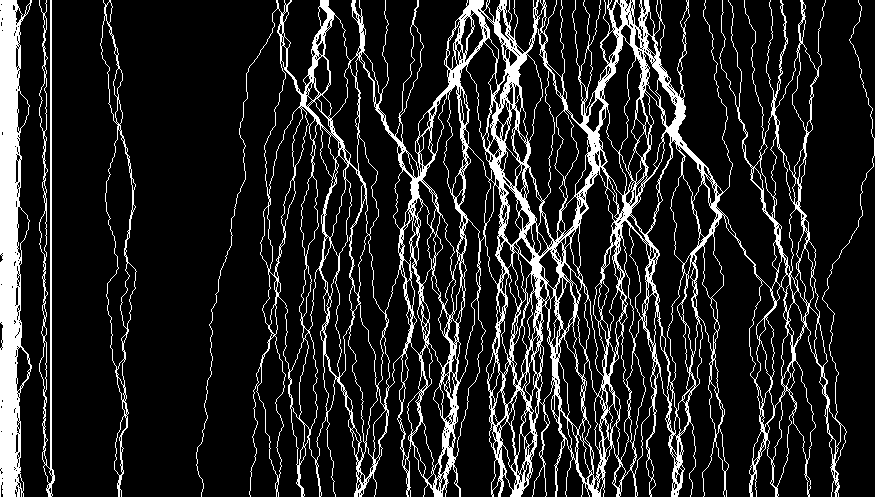

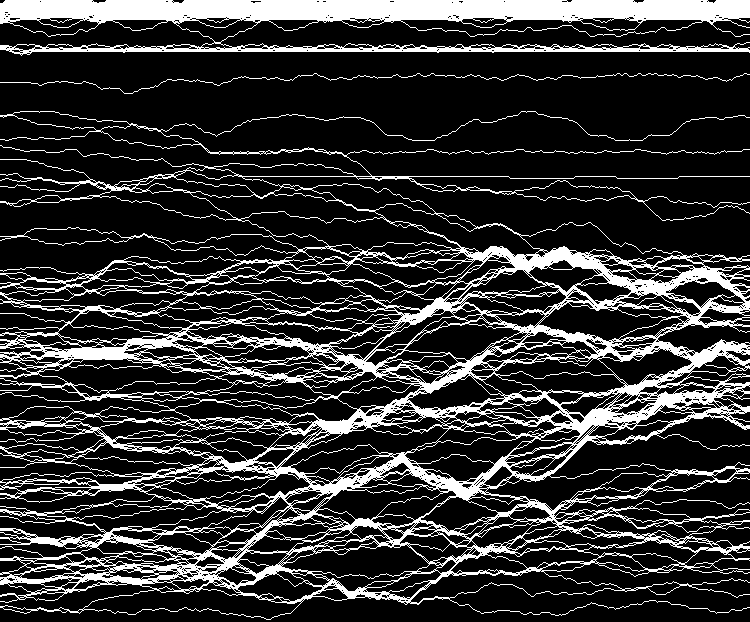

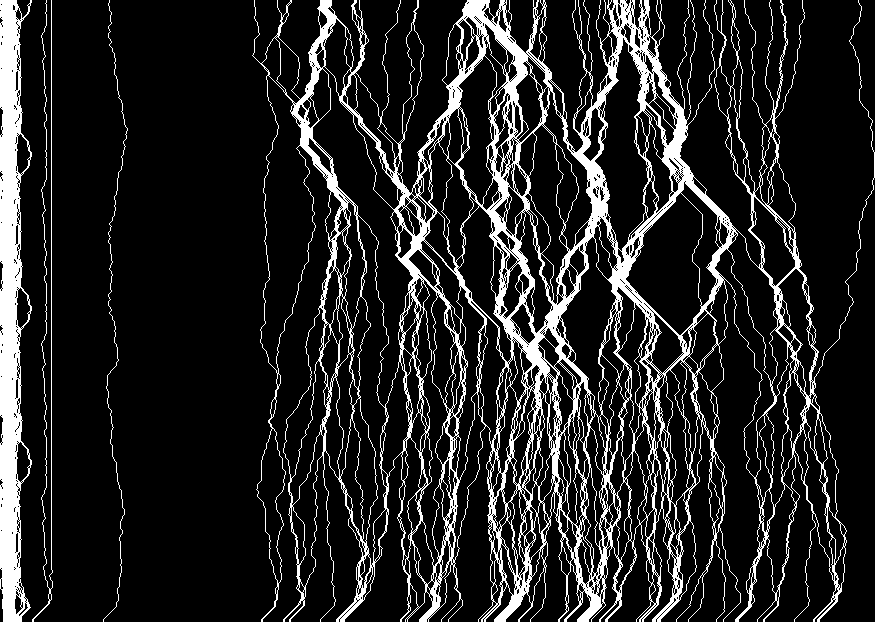

In [ ]:
fm=FI[0]
selectedFt=SELECTED
grayFm=fm[0,:,:,selectedFt]
grayFm=cv2.rotate(np.array(grayFm),cv2.ROTATE_90_CLOCKWISE)
showFeatureMapI(FI,I=selectedFt)
so,vseams,hseams=resize(
    grayFm,
    (grayFm.shape[1]*factors[0], grayFm.shape[0]*factors[1]),
    energy_mode='forward',   # Choose from {backward, forward}
    order='width-first',  # Choose from {width-first, height-first}
    keep_mask=None)
vseams2=cv2.rotate(vseams*255,cv2.ROTATE_90_COUNTERCLOCKWISE)
cv2_imshow(vseams2)
cv2_imshow(hseams*255)
so=cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE)

soe,vse,hse=resize(
    grayFm,
    (grayFm.shape[1]*factors[0], grayFm.shape[0]*factors[1]),
    energy_mode='forward',   # Choose from {backward, forward}
    order='height-first',  # Choose from {width-first, height-first}
    keep_mask=None)
vsea=cv2.rotate(vse*255,cv2.ROTATE_90_COUNTERCLOCKWISE)
cv2_imshow(hse*255)

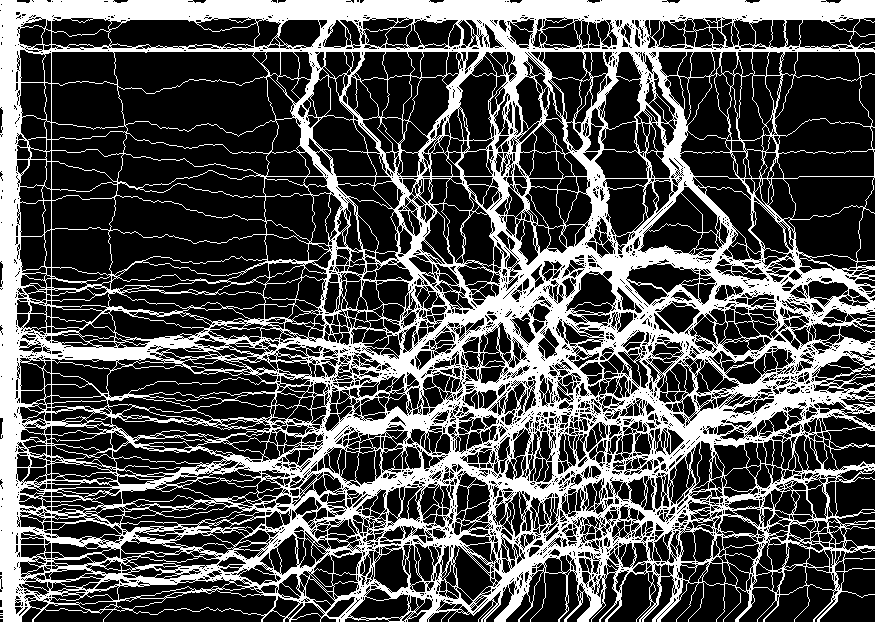

In [ ]:
# mask1=cv2.imread('/content/1.png')
# mask2=cv2.imread('/content/3.png')
mask1=vseams2
mask2=hse*255
masks=mask1+mask2
# masks=cv2.cvtColor(masks,cv2.COLOR_BGR2GRAY)
cv2_imshow(masks)

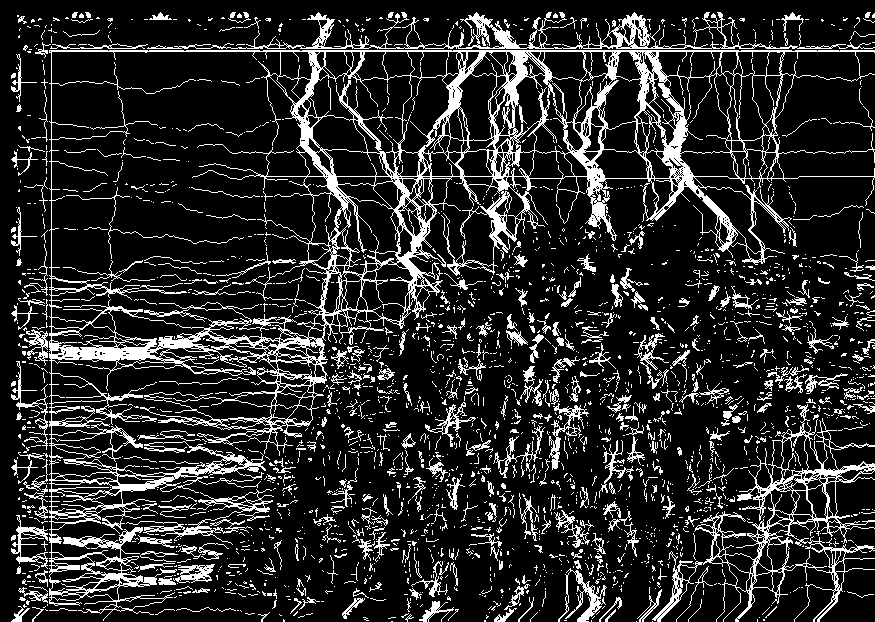

<class 'numpy.ndarray'>


In [ ]:
outMasks=masks.copy()
outMasks[:,:]=0
# cv2_imshow(outMasks)
# print(outMasks.shape,img.shape)
for nz in cv2.findNonZero(masks):
  # print(nz[0],tuple(img[nz[0][1],nz[0][0]]))
  if not colorS[0]==tuple(img[nz[0][1],nz[0][0]]):
    outMasks[nz[0][1],nz[0][0]]=255
cv2_imshow(outMasks)
print(type(outMasks))

In [ ]:
# Applying thresholding technique
_, alpha = cv2.threshold(outMasks.astype(np.uint8), 0, 255, cv2.THRESH_BINARY)

# Using cv2.split() to split channels
# of coloured image
bgrMask=cv2.cvtColor(outMasks,cv2.COLOR_GRAY2BGR)
for nz in cv2.findNonZero(outMasks):
    bgrMask[nz[0][1],nz[0][0]]=(0,255,0)
b, g, r = cv2.split(bgrMask)

# Making list of Red, Green, Blue
# Channels and alpha
rgba = [b, g, r, alpha]

# Using cv2.merge() to merge rgba
# into a coloured/multi-channeled image
dst = cv2.merge(rgba, 4)

# Writing and saving to a new image
cv2.imwrite("mask.png", dst)

error: ignored

(875, 625, 3) (875, 625)


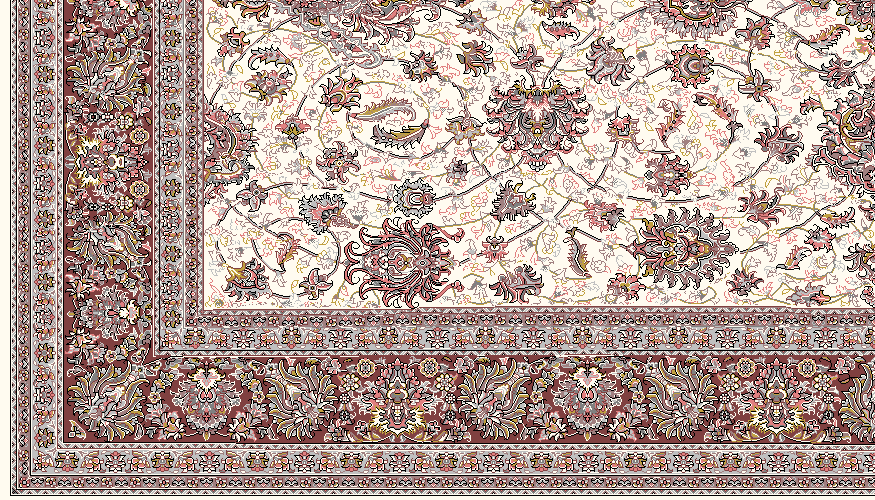

(500, 875, 3)


In [ ]:
imgR=cv2.rotate(img,cv2.ROTATE_90_CLOCKWISE)
print(imgR.shape,vseams.shape)
so=remove_with_seams_mask(imgR,
        (imgR.shape[1]*factors[0], imgR.shape[0])
        ,seams_mask=vseams)
# cv2_imshow(cv2.rotate(vseams*255,cv2.ROTATE_90_COUNTERCLOCKWISE))
so=cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE)
cv2_imshow(so)
print(so.shape)
# colorsCount,colorS=CountandShowImagePallet(so)

In [ ]:
so=remove_with_seams_mask(so,
        (so.shape[1]*factors[1], so.shape[0])
        ,seams_mask=hseams)
cv2_imshow(so)
print(so.shape)
# colorsCount,colorS=CountandShowImagePallet(so)

IndexError: ignored

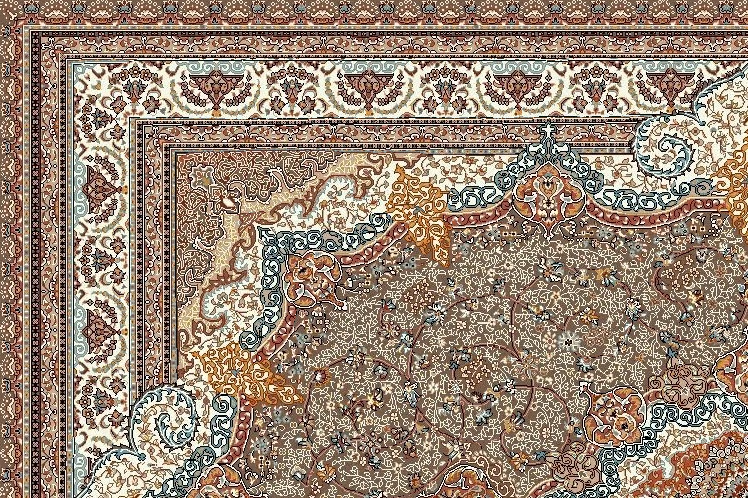

True

In [ ]:
cv2_imshow(so)
cv2.imwrite('9ANAH-G-to6.jpg',so)

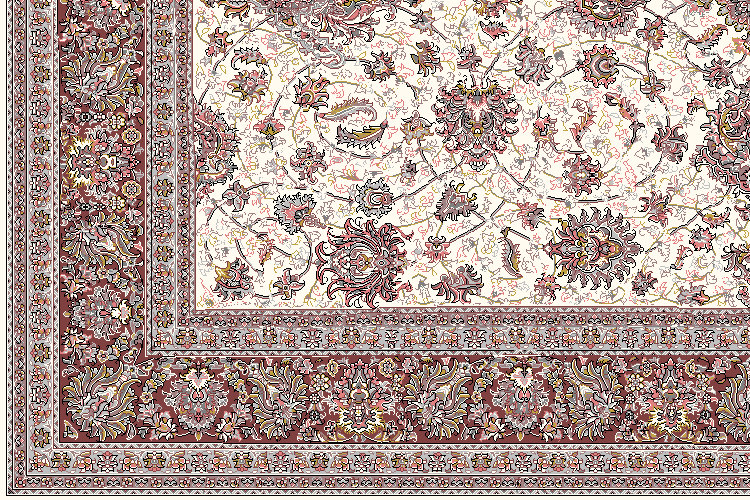

colors: 9


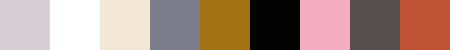

In [ ]:
 colorsCount,colorS=CountandShowImagePallet(cv2.imread('test2.bmp'))

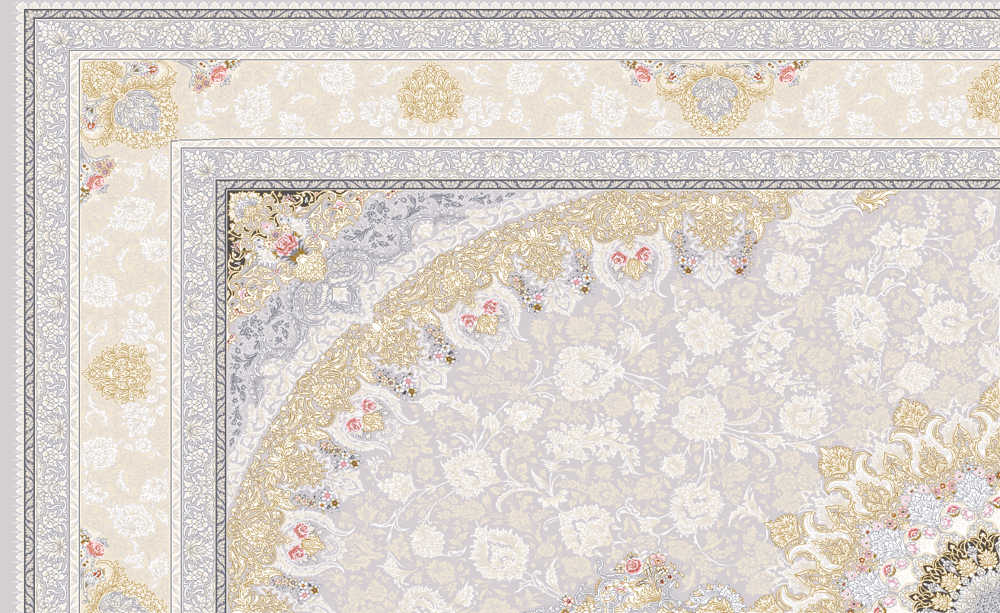

In [ ]:
cv2.imwrite('final.bmp',cv2.resize(so,( 1875,1150),cv2.INTER_NEAREST))
cv2_imshow(cv2.resize(so,(1875,1150),cv2.INTER_NEAREST))

inputSize (1725, 2500, 3)
targetSize (1642, 2500)
factors (0.9518840579710145, 1.0)
deltas (0, -83)


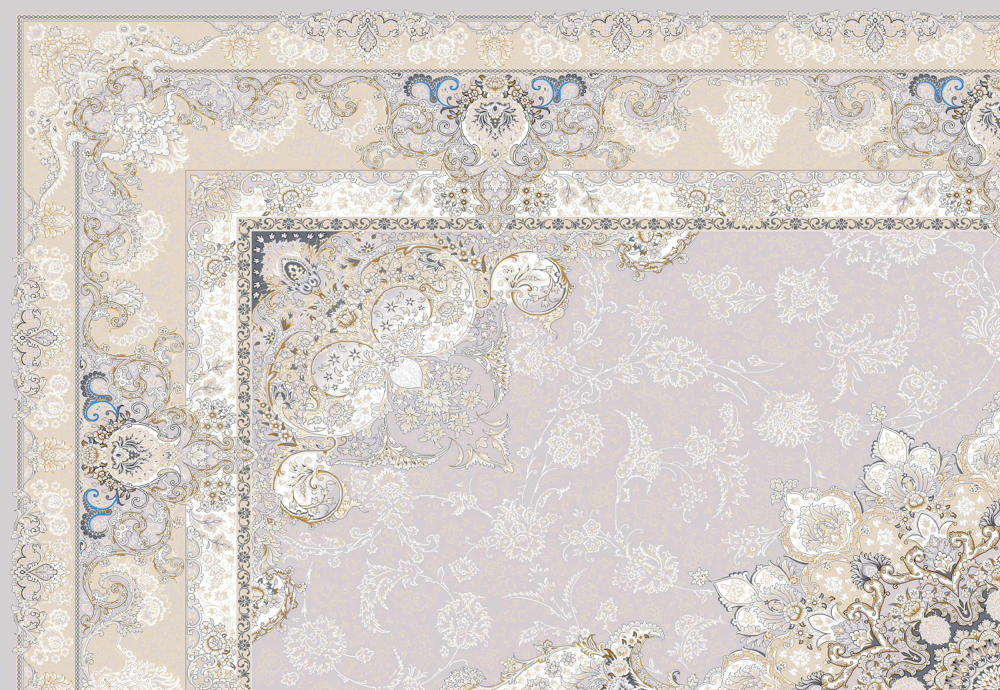

<ipython-input-17-d270f7418bd9>:165: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  seams_mask = np.zeros((h, w), dtype=np.bool)
<ipython-input-17-d270f7418bd9>:23: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return ~np.eye(src.shape[1], dtype=np.bool)[seam]


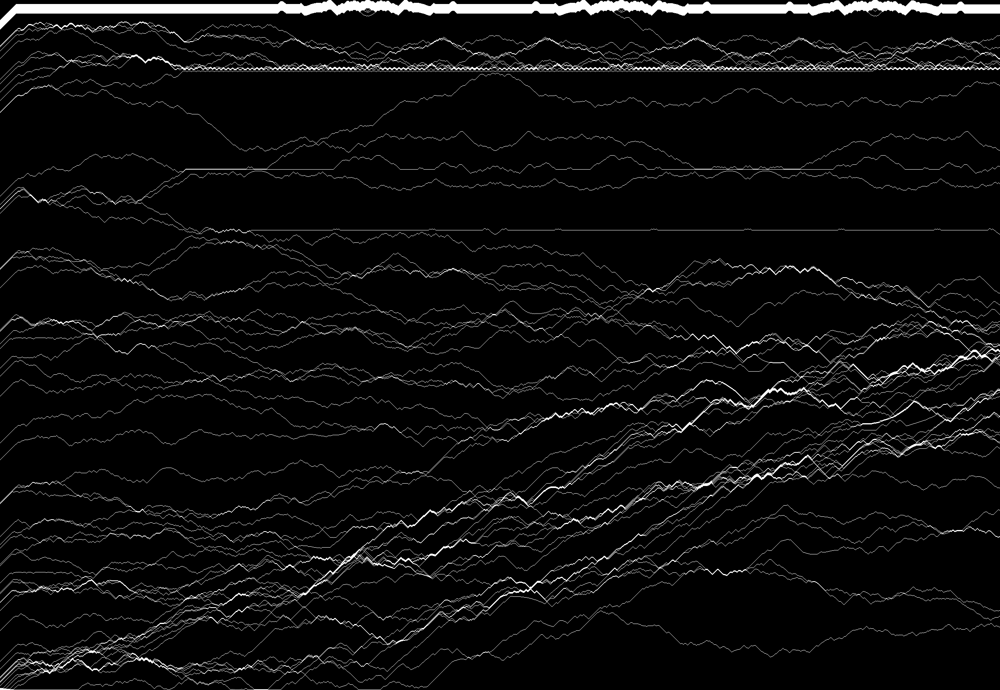

In [ ]:
gc.collect()
qImagePath='/content/quarter/12_tabrizan_f_00.bmp'
img=cv2.imread(qImagePath)

inputSize=img.shape
targetSize=( 1642,2500)

print('inputSize',inputSize)
print('targetSize',targetSize)
fy=targetSize[0]/inputSize[0]
fx=targetSize[1]/inputSize[1]
dy=targetSize[0]-inputSize[0]
dx=targetSize[1]-inputSize[1]
factors=(fy,fx)
deltas=(int(dx),int(dy))
print('factors',factors)
print('deltas',deltas)
cv2_imshow(img)

img=cv2.rotate(img,cv2.ROTATE_90_CLOCKWISE)
# so,vseams,hseams=CalcSeamCarving(img,factors[0])
so,vseams,hseams=resize(
    img,
    (img.shape[1]*factors[0], img.shape[0]*factors[1]),
    energy_mode='forward',   # Choose from {backward, forward}
    order='width-first',  # Choose from {width-first, height-first}
    keep_mask=None)
cv2_imshow(cv2.rotate(vseams*255,cv2.ROTATE_90_COUNTERCLOCKWISE))
so=cv2.rotate(so,cv2.ROTATE_90_COUNTERCLOCKWISE)

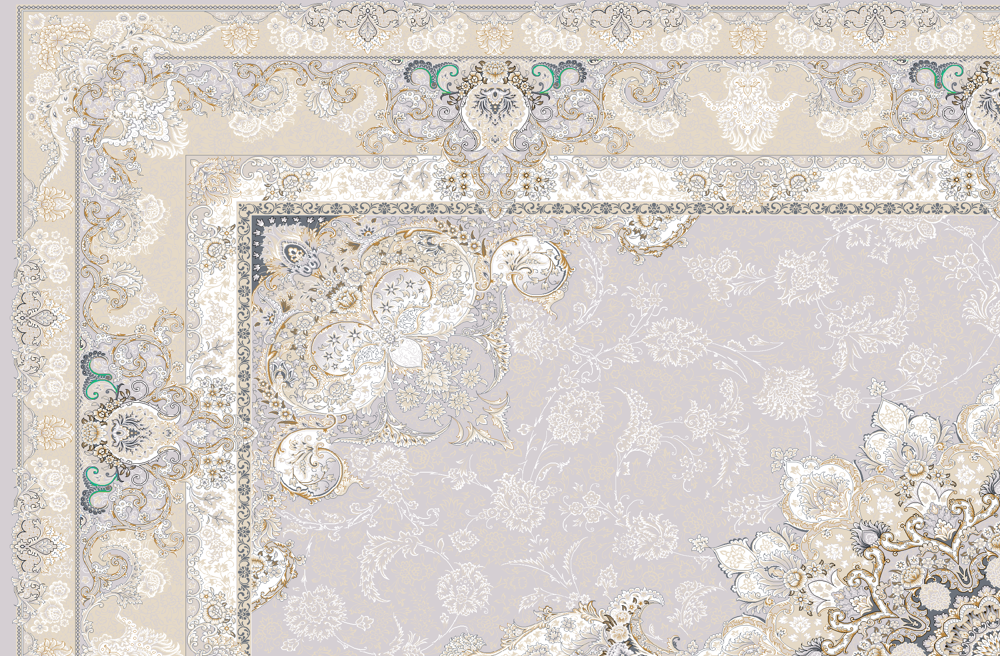

True

In [ ]:
cv2_imshow(so)
cv2.imwrite('test1.bmp',so)

(1437, 2187, 3)
colors: 8


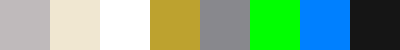

In [ ]:
 print(so.shape)
 colorsCount,colorS=CountandShowImagePallet(cv2.imread('test1.bmp'))

In [ ]:
imagePath="/content/color_generated_at_iteration_950.bmp"
content_imagePath="/content/9_noyan_f-rangi-final.bmp"
img=cv2.imread(imagePath)
colorsCount,colorS=CountandShowImagePallet(cv2.imread(content_imagePath))
print(colorS)
img=makeImageNColors(img,colorsCount)
colorsCount2,colorS2=CountandShowImagePallet(img)
print(colorS2)
height,width,_=img.shape


In [ ]:
map=[0,2,1,4,3,6,7,8,5]
cv2_imshow(img)
img2=img.copy()
for i in range(height):
  for j in range(width):
      k = img[i,j]
      # print(k)
      # dists=[]
      # for cls in colorS:
      #   dists.append(math.dist([k[2],k[1],k[0]],[cls[2],cls[1],cls[0]]))
      # img[i,j]=colorS[dists.index(min(dists))]
      # colorS.pop(dists.index(min(dists)))
      img2[i,j]=colorS[map[colorS2.index((k[0],k[1],k[2]))]]
cv2_imshow(img2)

In [ ]:
import os
from email.mime.text import MIMEText
from email.mime.multipart import MIMEMultipart
import smtplib



def sendMail(email_settings,receiver_address, subject, text, attachmentName=[]):
    message = MIMEMultipart()
    message['From'] = email_settings['sender_address']
    message['To'] = receiver_address
    message['Subject'] = subject
    message.attach(MIMEText(text, 'plain', 'utf-8'))
    if attachmentName:
        for attachment in attachmentName:
            att_name = os.path.basename(attachment)
            att1 = MIMEText(open(attachment, 'rb').read(), 'base64', 'utf-8')
            att1['Content-Type'] = 'application/octet-stream'
            att1['Content-Disposition'] = 'attachment; filename=' + att_name
            message.attach(att1)

    session = smtplib.SMTP('smtp.gmail.com', 587) #use gmail with port
    session.starttls() #enable security
    session.login(email_settings['sender_address'], email_settings['sender_pass']) #login with mail_id and password
    text = message.as_string()
    session.sendmail(email_settings['sender_address'], receiver_address, text)
    session.quit()

email_settings= {
        'sender_address':'iwish.solutions1@gmail.com',
        'sender_pass':'ghqlynbiucwlwsxz',
    }

receiver_address='sarina_pars@yahoo.com'
attachments=['/content/9_SETAYESH_rangi_final-to6.bmp']
email_subject='Resize Project Completion'
email_text="Dear "+receiver_address+",\n\nWe are writing to inform you that your resize project is now complete. Please find attached the output file, which is a demo version of the solution and not the final product.\n\nWe kindly request that you provide us with your feedback on the demo version, so we can make any necessary adjustments to ensure that the final product meets your expectations.\n\nThank you for your collaboration ,and we look forward to hearing from you soon.\n\nBest regards,\n\n\n\nبا سلام،\n\nبه اطلاع می‌رسانیم که پروژه تغییر اندازه شما به پایان رسیده و انجام شده است. لطفاً فایل خروجی را در این پیوست مشاهده فرمایید.\n\n در نظر داشته باشید این یک نسخه دمو از پروژه تغییر سایز هوشمند نقشه های فرش است، لطفاً بازخورد خود را با ما به اشتراک بگذارید تا برای برآورده شدن نیازمندی های شما قدم برداریم.\n\nاز همکاری شما سپاسگزاریم و منتظر بازخورد شما هستیم.\n\nبا احترام،"
sendMail(email_settings,receiver_address,email_subject,email_text,attachments)

emails=['iman.ranjbar@gmail.com','shahab.hashemi.doc@gmail.com','s.s.mousavi90@gmail.com']
# receiver_address='sarina_pars@yahoo.com'
attachments=['/content/9_SETAYESH_rangi_final-to6.bmp']
email_subject='Resize Project Completion and sent to '+receiver_address
email_text="9 to 6,"
for ems in emails:
  sendMail(email_settings,ems,email_subject,email_text,attachments)
  print(ems)

iman.ranjbar@gmail.com
shahab.hashemi.doc@gmail.com
s.s.mousavi90@gmail.com


In [12]:
import smtplib
from email import message_from_string,message_from_bytes
import traceback
import imaplib
email_settings= {
        'sender_address':'iwish.solutions1@gmail.com',
        'sender_pass':'ghqlynbiucwlwsxz',
    }
try:
  # session = smtplib.SMTP('smtp.gmail.com', 587) #use gmail with port
  session = imaplib.IMAP4_SSL('imap.gmail.com')
  # session.starttls() #enable security
  session.login(email_settings['sender_address'], email_settings['sender_pass']) #login with mail_id and password
  print(session)
  session.select('inbox')
  data = session.search(None, 'ALL')
  # print(data)
  mail_ids = data[1]
  id_list = mail_ids[0].split()
  first_email_id = int(id_list[0])
  latest_email_id = int(id_list[-1])

  for i in range(latest_email_id-1,latest_email_id-2,-1):#first_email_id, -1):
      data = session.fetch(str(i), '(RFC822)' )
      for response_part in data:
          arr = response_part[0]
          if isinstance(arr, tuple):
              # msg = message_from_string(str(arr[1],'utf-8'))
              msg = message_from_bytes(arr[1])
              email_subject = msg['subject']
              email_from = msg['from']
              if 'parspack.com' in email_from:
                continue
              print('From : ' + email_from + '\n')
              print('Subject : ' + email_subject + '\n')
              print(msg)

except Exception as e:
  traceback.print_exc()
  print(str(e))

From : Postman Team <noreply@notifications.getpostman.com>

Subject : Activate Your Postman Account Now

Delivered-To: iwish.solutions1@gmail.com
Received: by 2002:a05:6022:5675:b0:40:dd21:5b85 with SMTP id er21csp2367068lab;
        Sun, 18 Jun 2023 01:02:52 -0700 (PDT)
X-Google-Smtp-Source: ACHHUZ5a8GeXaCXnOmDWLP8uaMMMr1pJUvTcdZho4nWUS/55si2McFjzGZe4ZA8x//Drt5KPEnGg
X-Received: by 2002:a25:8252:0:b0:bb3:9001:e2fe with SMTP id d18-20020a258252000000b00bb39001e2femr3849060ybn.13.1687075372321;
        Sun, 18 Jun 2023 01:02:52 -0700 (PDT)
ARC-Seal: i=1; a=rsa-sha256; t=1687075372; cv=none;
        d=google.com; s=arc-20160816;
        b=ZlierH0FgXphOjFncttI4bgnP1QSoks/vnUn9TR6hwFDhdIOkbZNmNbD6MP/GHXaWM
         gIBAgpKz+7sXHfLD6I4B83MU1upeGhnjL8EWw7/Yip7EfnIb8UKpU0LPkgZSC0psJh7Q
         0cOCQH/Cm6yUpdV6xKLspR9YA9mrn3LjHcFguQBPDg2lZqpmG44H5rcycUhOK9AIYv54
         SMrOb0XTpLrbTEFM892iDHAmuzT6k8Cz/O8heU+B1OrwccNjUYBBDNyTLzVLrpNOlQqT
         FhF8FbsC9cHNHxeeJifhUurOokqFsvJNNxBFH5zrzDsUw

In [11]:
from email import message_from_bytes
if msg.is_multipart():
  # iterate over email parts
  for part in msg.walk():
      # extract content type of email
      content_type = part.get_content_type()
      content_disposition = str(part.get("Content-Disposition"))
      try:
          # get the email body
          body = part.get_payload(decode=True).decode()
      except:
          pass
      print(body)